# State of M2E & P2E

In [1]:
# prep
import pandas as pd
import numpy as np
# import matplotlib.pyplot as plt
import os, time
from datetime import datetime
from pycoingecko import CoinGeckoAPI  # Community project. See: https://github.com/man-c/pycoingecko

import ipywidgets as widgets
from ipywidgets import HBox, Layout
import sys
sys.path.append('/home/lstm/Github/jp-codes-ubuntu/modules/')
sys.path.append('/home/lstm/Github/300fit/')
if os.environ['NAME'] == 'DESKTOP-OCNB1KD': 
    sys.path.append('/mnt/c/users/jp/Documents/Github/jp-codes-ubuntu/modules/')
    sys.path.append('/mnt/c/users/jp/Documents/Github/300fit/')
import dummyf
from python_helpers import \
    coingecko_get_data_by_id, coingecko_get_df, produce_mkt_weighted_index, plot_log_unif, get_ohlc_from_bianace
import plotly.express as px
pd.options.plotting.backend = "plotly" #"matplotlib"

# define csv data srouce
csv_data_root = '/home/lstm/insync/jaesangpark@gmail.com/Google Drive/'
if os.environ['NAME'] == 'DESKTOP-OCNB1KD': csv_data_root = '/mnt/g/내 드라이브/'

# minimum data length requriements
min_len_M2E = 150
min_len_P2E = 360

# coingecko data retreival code
cg = CoinGeckoAPI()
num_days = 2000

In [7]:
# download list of symbols from coingecko
df_gc_tmp = pd.DataFrame(cg.get_coins_list())

# get NFCI
FCI = pd.read_csv(csv_data_root + 'Data Exchange/ESG/data/NFCI.csv', index_col='DATE', parse_dates=True) * -1

# get top 4 coins
top4_ids = df_gc_tmp.loc[
    df_gc_tmp['symbol'].isin(['btc','eth','ada','bnb']) & ~df_gc_tmp['id'].str.contains('-'),
    'id']

assert len(top4_ids) == 4
df_pr_top4 = pd.DataFrame()
df_mkt_top4 = pd.DataFrame()
for idn in top4_ids:
    pr, mkt = coingecko_get_data_by_id(idn, num_days)
    df_pr_top4 = pd.concat([df_pr_top4, pr], axis=1)
    df_mkt_top4 = pd.concat([df_mkt_top4, mkt], axis=1)
    print(idn)
    
print('first date w/o nan value: ', df_mkt_top4.dropna().index[0])
df_idx_top4 = produce_mkt_weighted_index(df_mktcap=df_mkt_top4.dropna(), name='top4 crypto index') 

binancecoin
bitcoin
cardano
ethereum
first date w/o nan value:  2017-10-18 00:00:00


## STEPN Rug Pull Looming?

### Window Dressing / Outright False Information
https://twitter.com/Stepnofficial/status/1528954405638115331<br>
https://stepnofficial.medium.com/stepns-story-of-success-6a439047554<br>
NFT marketplace commission of 4% to 'designers'<br>
NFT mint stats --> check for sudden increase <br> <br>

STEPN new plan in May 2022: https://stepnofficial.medium.com/stepns-action-plan-for-game-economy-db67fcba405<br>
(lifting GMT price seems to be the main focus) <br>
GST price prediciton by some guy: https://twitter.com/lookonchain/status/1534190623552864256?s=21&t=DGv7iOvNmlk-_koSKCaOQQ


### GST market cap
https://twitter.com/zhdvld/status/1530962682954018816

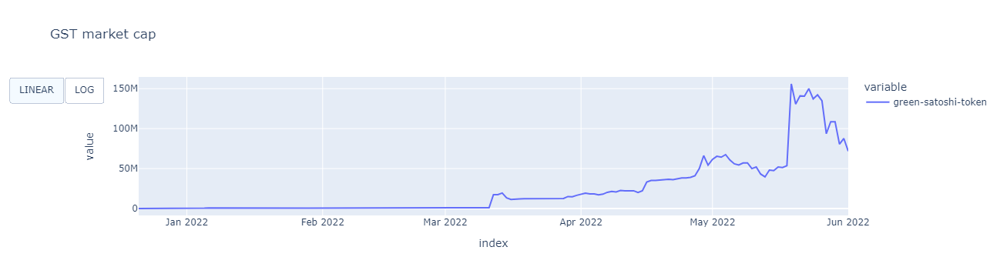

In [4]:
_, GST_mktcap = coingecko_get_data_by_id('green-satoshi-token', num_days)  
plot_log_unif(GST_mktcap, 'GST market cap').show()

### AXS v. GMT

#### Community Treasury
AXS treasury: https://explorer.roninchain.com/address/ronin:a99cacd1427f493a95b585a5c7989a08c86a616b <br>
GMT treasury: https://solscan.io/account/stepnnmTZcdZQ6HDqUVoU6KcYP8kBAHKzyj2jpiiwaH

#### Staking
AXS pool: https://explorer.roninchain.com/address/ronin:05b0bb3c1c320b280501b86706c3551995bc8571 <br>
GMT: No protocol staking. Only on exchanges.

#### AXS v. GMT MArket Stats & Prediction
STEPN NFT stats: https://moon.ly/nft/stepn <br>
(Magic Eden API: https://api.magiceden.dev/)

In [2]:
as_list = ['axie-infinity', 'stepn']
as_price, as_mktcap = coingecko_get_df(slug_list=as_list, num_days=num_days, min_length=1)

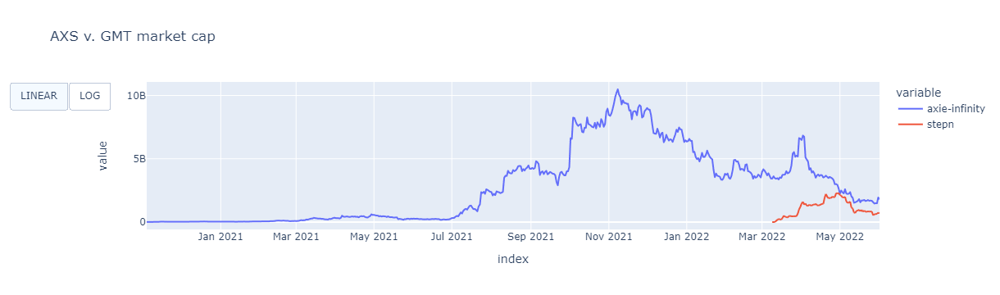

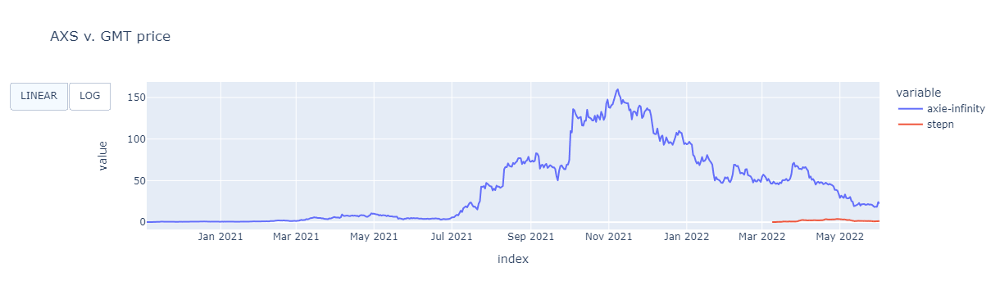

In [5]:
plot_log_unif(as_mktcap, 'AXS v. GMT market cap').show()
plot_log_unif(as_price, 'AXS v. GMT price').show()

### GST Performance v. Top Coins

In [8]:
# read df_fit from google sheet
sheet_id = "1kANEcL3u96Kca-Gle_saSXpgOmkycL_VH2cI0Cxraaw"
sheet_name = "df_fit"
gurl = f"https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}"
sym_table_CMC = pd.read_csv(gurl)

# extract symbols for M2E group
filt = ['Move To Earn' in eval(row['tags']) for i, row in sym_table_CMC.iterrows()]
group_M2E = sym_table_CMC.loc[filt, 'symbol'].str.lower().to_list()

# add known M2E gc symbols manually
group_M2E = group_M2E + ['gst-sol']

# extract symbol available on coingecko, using CMC symbols in lower case
# df_gc = df_gc_tmp.loc[df_gc_tmp['symbol'].isin(sym_table_CMC['symbol'].str.lower()), :]

# extract M2E group, review, edit, & get price
df_M2E = df_gc_tmp.loc[df_gc_tmp['symbol'].isin(group_M2E), :]

p2e_gc_names = ['Digital Fitness', 'DOSE', 'dotmoovs', 'Genopets', 'STEPN', 'Wirtual', 'STEPN Green Satoshi Token on Solana']
df_M2E = df_M2E.loc[df_M2E['name'].isin(p2e_gc_names), :]

# get M2E price & market cap
M2E_price = pd.DataFrame()
M2E_mktcap = pd.DataFrame()
for sym in df_M2E['id']:
    df_pr, df_mkt = coingecko_get_data_by_id(sym, num_days)   
    if len(df_pr.dropna()) < min_len_M2E: continue
    M2E_price = pd.concat([M2E_price, df_pr], axis=1)      
    M2E_mktcap = pd.concat([M2E_mktcap, df_mkt], axis=1)

# get GST price & market cap    
df_gst = pd.concat([M2E_price['green-satoshi-token'], M2E_mktcap['green-satoshi-token']], axis=1).dropna()
df_idx_tmp = df_idx_top4.loc[df_idx_top4.index.isin(df_gst.index), :].sort_index()
df_ = pd.concat([df_gst, df_idx_tmp], axis=1)#.replace({0: np.nan}).dropna()
df_.columns = ['GST_price', 'GST_mktcap', 'top 4 index']

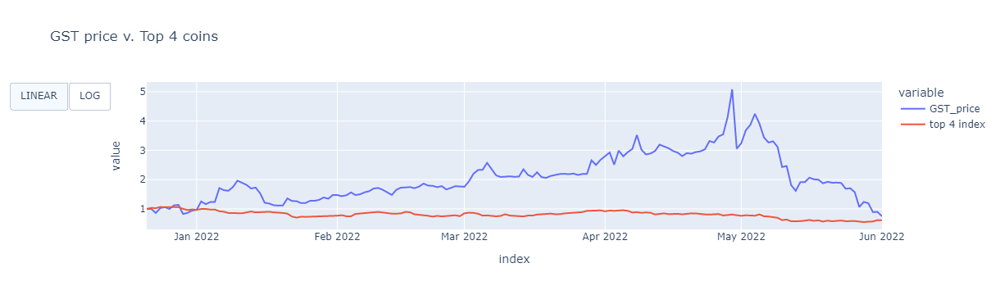

In [9]:
# index-ize & plot
plot_log_unif(df_.apply(lambda x: x/x.iloc[0]).loc[:, ['GST_price', 'top 4 index']], 'GST price v. Top 4 coins').show()

In [ ]:
# df__.replace({0:np.nan}).dropna().tail(30).apply(lambda x: x/x.iloc[0]).loc[
#     :, ['GST_mktcap', 'top 4 index']].plot(title='GST mktcap v. Top 4 coins, last 30 dyas')

In [23]:
# stdd_df__ = (df__ - df__.mean(axis=0))/df__.std(axis=0)
# FCI_tmp = FCI.loc[FCI.index.isin(df__.index), :]
# stdd_FCI_tmp = (FCI_tmp - FCI_tmp.mean())/FCI_tmp.std()
# fig2 = stdd_df__.plot(title='GST, top4, NFCI, standardized')
# fig2_tmp = stdd_FCI_tmp.div(stdd_FCI_tmp['NFCI'][0]).plot(color_discrete_sequence=["red", "black"])
# fig2.add_trace(fig2_tmp.data[0])
# fig2.show()

## M2E Token Performance

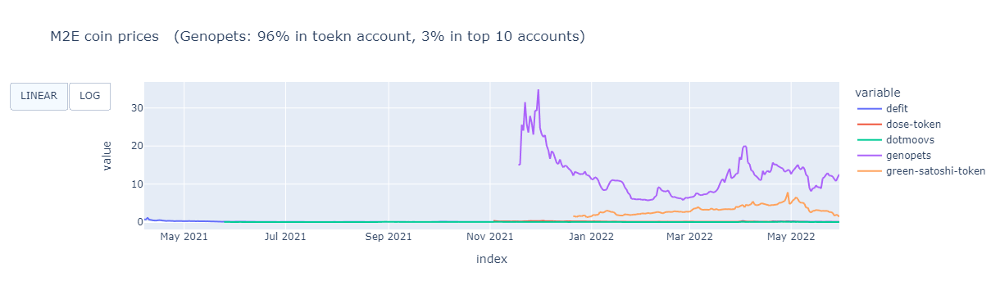

In [41]:
plot_log_unif(M2E_price, 'M2E coin prices \n (Genopets: 96% in toekn account, 3% in top 10 accounts)').show()

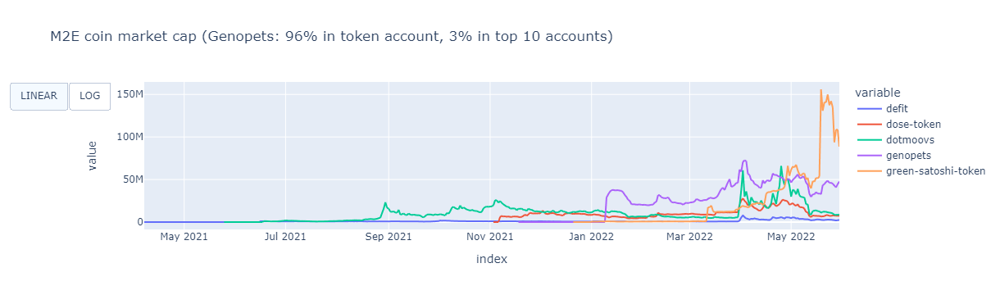

In [42]:
plot_log_unif(M2E_mktcap, 'M2E coin market cap (Genopets: 96% in token account, 3% in top 10 accounts)').show()

In [44]:
# M2E_mktcap.apply(np.log10).plot(title='M2E coin market cap in log10')

## P2E Token Performance

In [ ]:
# P2E mktcap v. crypto index
filt = ['Play To Earn' in eval(row['tags']) for i, row in sym_table_CMC.iterrows()]
group_P2E = sym_table_CMC.loc[filt, 'symbol'].str.lower().to_list()

# extract M2E group, review, edit, & get price
df_P2E = df_gc_tmp.loc[df_gc_tmp['symbol'].isin(group_P2E) & ~df_gc_tmp['name'].str.contains('(Wormhole)'), :]

# get data
P2E_price = pd.DataFrame()
P2E_mktcap = pd.DataFrame()
for sym in df_P2E['id']:
    time.sleep(1)
    df_pr, df_mkt = coingecko_get_data_by_id(sym, num_days)       
    if len(df_pr.dropna()) < min_len_P2E: continue
    if np.sum(df_mkt.dropna()==0)[0] > 0: continue    
    P2E_price = pd.concat([P2E_price, df_pr], axis=1)      
    P2E_mktcap = pd.concat([P2E_mktcap, df_mkt], axis=1)  
    print(sym)
    
P2E_price.dropna(inplace=True)
P2E_mktcap.dropna(inplace=True)    

In [50]:
# # clean up data (if not yet cleaned up)
# for coll in P2E_mktcap.columns:
#     if len(P2E_mktcap[coll].replace({0:np.nan}).dropna()) < min_len_P2E:
#         P2E_mktcap.drop(columns=[coll], inplace=True)
#         P2E_price.drop(columns=[coll], inplace=True)
#     if np.sum(P2E_mktcap[coll].dropna()==0) > 0:
#         P2E_mktcap.drop(columns=[coll], inplace=True)
#         P2E_price.drop(columns=[coll], inplace=True)

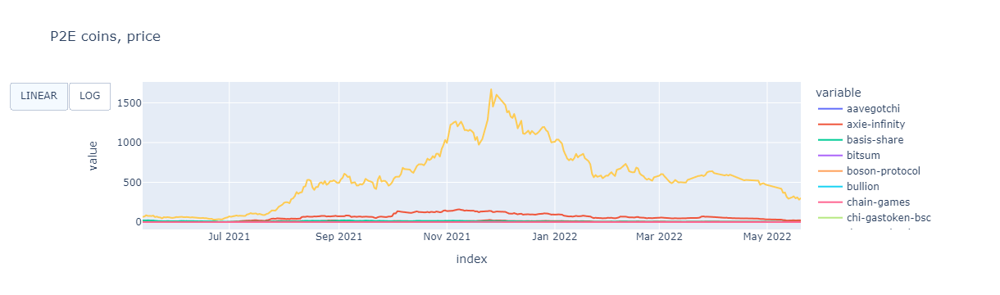

In [43]:
plot_log_unif(P2E_price, 'P2E coins, price', 'closest').show()

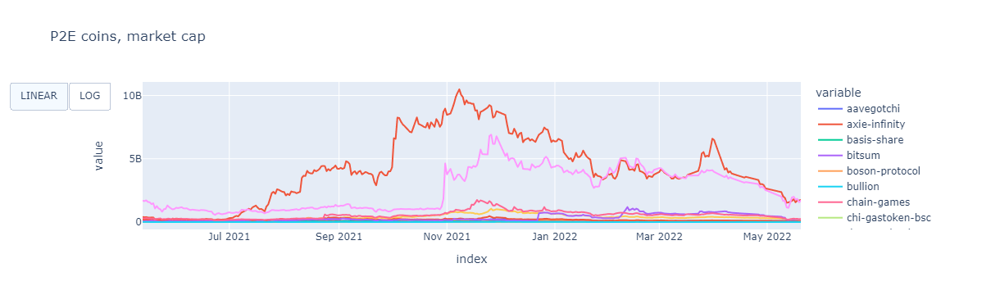

In [45]:
plot_log_unif(P2E_mktcap, 'P2E coins, market cap', hmode='closest').show()

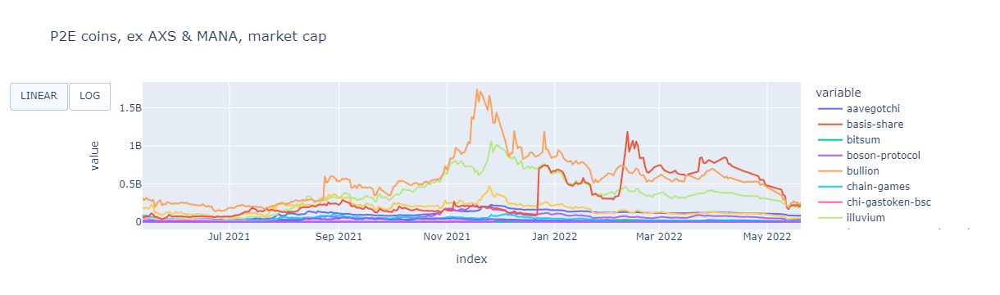

In [46]:
plot_log_unif(P2E_mktcap.drop(columns=['axie-infinity', 'decentraland']), 'P2E coins, ex AXS & MANA, market cap', hmode='closest').show()

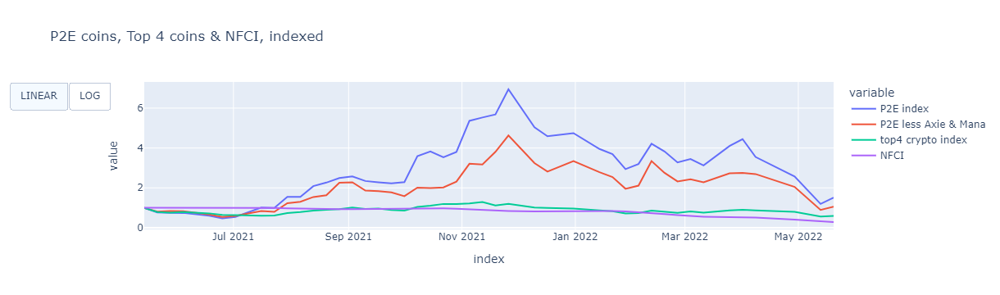

In [62]:
df_p2e = produce_mkt_weighted_index(P2E_mktcap, 'P2E index')
df_idx_tmp = df_idx_top4.loc[df_idx_top4.index.isin(df_p2e.index), :].sort_index()

df_p2e_less2 = produce_mkt_weighted_index(P2E_mktcap.drop(columns=['axie-infinity', 'decentraland']), 'P2E less Axie & Mana') 
df_idx_tmp_less = df_idx_top4.loc[df_idx_top4.index.isin(df_p2e.index), :].sort_index()


df__ = pd.concat([df_p2e, df_p2e_less2, df_idx_tmp, FCI], axis=1, join='inner')#.replace({0: np.nan}).dropna()
# df__.columns = ['GST_price', 'GST_mktcap', 'top 4 index']

# index-ize & plot
plot_log_unif(df__.apply(lambda x: x/x.iloc[0]), 'P2E coins, Top 4 coins & NFCI, indexed').show()

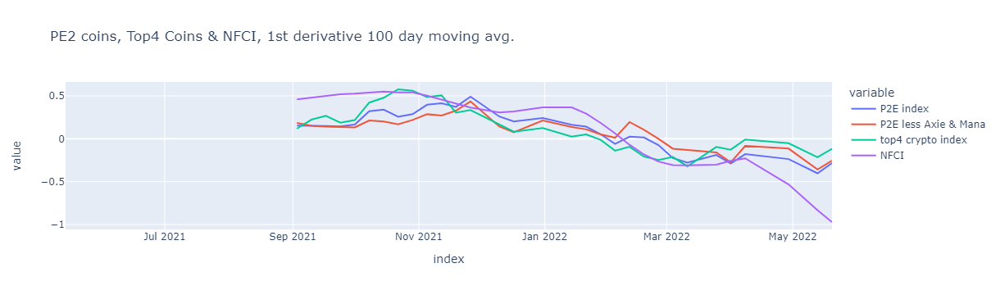

In [99]:
(df__.diff() - df__.diff().mean()).div(df__.diff().std()).rolling(14).mean().plot(title='PE2 coins, Top4 Coins & NFCI, 1st derivative 100 day moving avg.')

## Newly Launched P2E & M2E Tokens (on Binance, Past 3, 6, 12 Months & All)

In [63]:
# get list of all assets availabl on CMC
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json, itertools
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': '806aaadd-bb84-47b0-a551-0b0c244b4782',
}

session = Session()
session.headers.update(headers)

url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/map'
response = session.get(url)#, params=parameters)
data_cmc = json.loads(response.text)
data = data_cmc.copy()
_coinmap = pd.DataFrame(data['data']).sort_values('rank').reset_index(drop=True)
print('num. symbols available: ', len(_coinmap), '\n')

# check for duplicate symbols --> remove lower-ranked symbols
print('duplicated symbols (being removed):', sum(_coinmap['symbol'].duplicated()), '\n')
coinmap = _coinmap.loc[~_coinmap['symbol'].duplicated(keep='first'), :].reset_index(drop=True)
dropped_symbols = _coinmap.loc[~_coinmap['id'].isin(coinmap['id']), ['name', 'symbol', 'rank']]

In [ ]:
# get metadata from CMC
url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/info'  # CMC cryptocurrenc / metadata v2 endpoint
metadata = pd.DataFrame()
for i in range(8600, 20000, 100):   
    time.sleep(15)
    parameters = {'slug': coinmap['slug'].iloc[i:i+100].to_csv(header=None, index=False).strip('\n').replace('\n', ',')}
    order = coinmap['slug'].iloc[i:i+100].to_list()
    response = session.get(url, params=parameters)
    data = json.loads(response.text)
    tmp = pd.DataFrame(data['data']).T.set_index('slug').loc[order]
    metadata = pd.concat([metadata, tmp]) 
metadata = metadata.reset_index().set_index('symbol')
# metadata

In [ ]:
# extract tokens that contain 'Earn' in tag-names
slugs_earn = pd.DataFrame()
for idx, row in metadata.iterrows():
    if not row['tag-names']: continue
    if 'To Earn' in str(row['tag-names']):
        print(str(row['tag-names']))
        slugs_earn = pd.concat([slugs_earn, row.to_frame().T])

In [ ]:
# get symbols available in Binanace
result = requests.get('https://api.binance.com/api/v3/ticker/price')
js = result.json()
bnb_symbols = [x['symbol'] for x in js]

common_dict = dict()
for bb in sorted(bnb_symbols):
    for ss in slugs_earn['symbol']:
        if ss in bb:
            common_dict.update({ss:bb}) 
# print(common_dict)            

In [ ]:
# get price data from Binanace --> compile in 3-month and 6-month tranches (Binance listing date)
start = '2000-01-01'
end = '2022-05-31'
exclude = ['BSW', 'WAXP', 'VIDT']
df_price_earn_3mnth = pd.DataFrame()
df_price_earn_6mnth = pd.DataFrame()
df_price_earn_12mnth = pd.DataFrame()
df_price_earn_all = pd.DataFrame()
for sym in slugs_earn.symbol:
    if sym in exclude: continue
    try:
        df_pr = get_ohlc_from_bianace(sym + "USDT", interval="1d", start_date=start, end_date=end)
        df_pr = df_pr.rename(columns={'time':'date'}).set_index('date')[['Close']]
        df_pr.columns = [sym]
        if df_pr.index[0] > datetime(2022, 3, 1): df_price_earn_3mnth = pd.concat([df_price_earn_3mnth, df_pr], axis=1)
        if df_pr.index[0] > datetime(2021, 12, 1): df_price_earn_6mnth = pd.concat([df_price_earn_6mnth, df_pr], axis=1)
        if df_pr.index[0] > datetime(2021, 6, 1): df_price_earn_12mnth = pd.concat([df_price_earn_12mnth, df_pr], axis=1)
        df_price_earn_all = pd.concat([df_price_earn_all, df_pr], axis=1)
        print(sym)
    except:
        print('error: ', sym)
        continue    

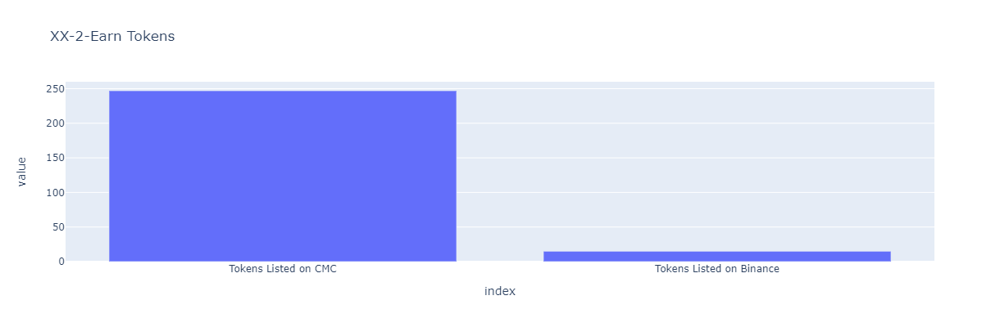

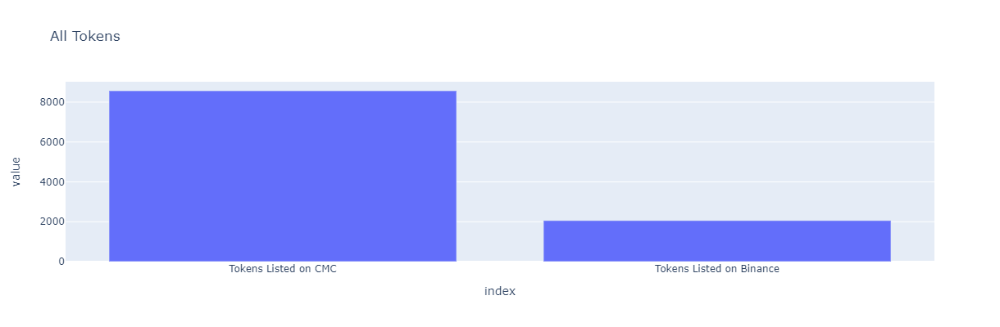

In [383]:
# plot CMC list v. BNB list, XX-2-Earn tokens
pie = pd.DataFrame({'Tokens Listed on CMC': len(slugs_earn['symbol']), 'Tokens Listed on Binance': len(df_price_earn_all.columns)}, index=['XX-2-Earn'])
fig_pie = px.bar(pie.T, width=800, height=400, title='XX-2-Earn Tokens')
fig_pie.layout.update(showlegend=False) 
fig_pie.show()

# plot CMC list v. BNB list, all tokens.coins
pie1 = pd.DataFrame({'Tokens Listed on CMC': len(coinmap), 'Tokens Listed on Binance': len(bnb_symbols)}, index=['All'])
fig_pie1 = px.bar(pie1.T, width=800, height=400, title='All Tokens')
fig_pie1.layout.update(showlegend=False) 
fig_pie1.show()

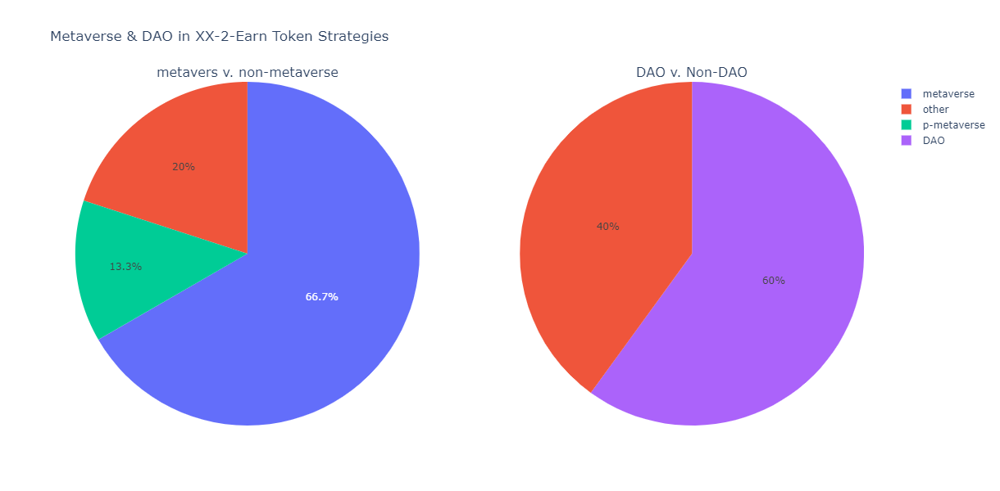

In [475]:
names_ = df_price_earn_all.columns.to_list()
metaverse_ = ['metaverse','metaverse','p-metaverse','other','metaverse','metaverse','metaverse','metaverse',
             'metaverse','metaverse','metaverse','other','other','metaverse','p-metaverse']
DAO_ = ['DAO','DAO','DAO','other','other','DAO','other','DAO','other','other','DAO','DAO','DAO','other','DAO']

strats = pd.DataFrame({'name':names_, 'metaverse':metaverse_, 'DAO':DAO_})

meta_ = strats[['name','metaverse']].groupby('metaverse').count()
D_ = strats[['name','DAO']].groupby('DAO').count()

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2,
                    specs=[[{"type": "domain"}, {"type": "domain"}]],
                    subplot_titles=("metavers v. non-metaverse", "DAO v. Non-DAO"))   
           

fig.add_trace(go.Pie(labels=meta_.index, values=meta_['name'].to_list()), row=1, col=1)
fig.add_trace(go.Pie(labels=D_.index, values=D_['name'].to_list()), row=1, col=2)
fig.update_layout(height=600, width=800, title_text='Metaverse & DAO in XX-2-Earn Token Strategies')
fig.show()

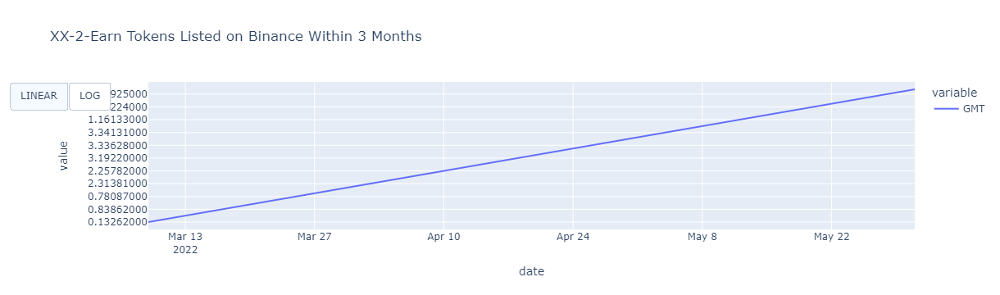

In [384]:
ff = plot_log_unif(df_price_earn_3mnth, 'XX-2-Earn Tokens Listed on Binance Within 3 Months')
ff.show()

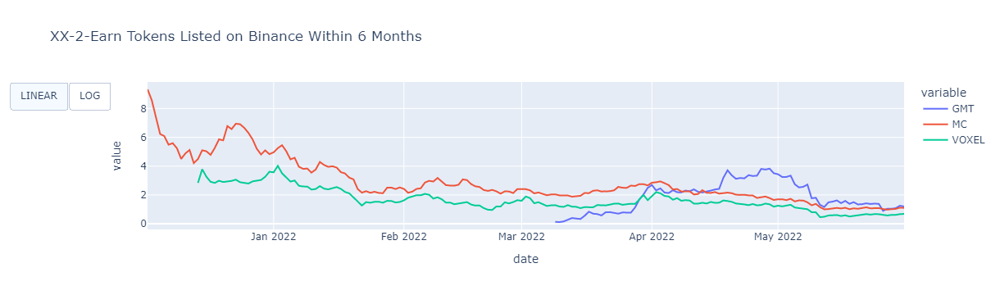

In [385]:
ff = plot_log_unif(df_price_earn_6mnth, 'XX-2-Earn Tokens Listed on Binance Within 6 Months')
ff.show()

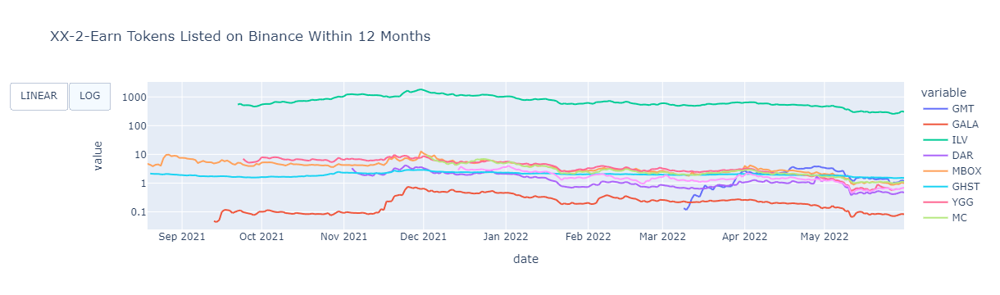

In [386]:
ff = plot_log_unif(df_price_earn_12mnth, 'XX-2-Earn Tokens Listed on Binance Within 12 Months', 'closest')
ff.show()

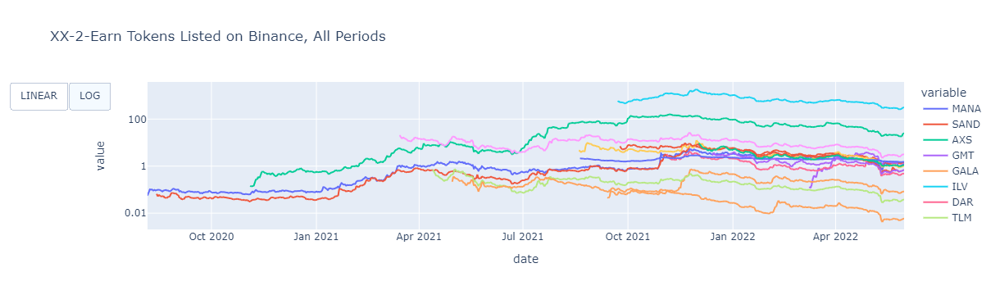

In [387]:
ff = plot_log_unif(df_price_earn_all, 'XX-2-Earn Tokens Listed on Binance, All Periods', 'closest')
ff.show()

## Top 4 coins (ex XRP) (Solana also out for short data availability (2020 ~))

In [11]:
# download list of symbols from coingecko
df_gc_tmp = pd.DataFrame(cg.get_coins_list())

# get NFCI
FCI = pd.read_csv(csv_data_root + 'Data Exchange/ESG/data/NFCI.csv', index_col='DATE', parse_dates=True) * -1

top4_ids = df_gc_tmp.loc[
    df_gc_tmp['symbol'].isin(['btc','eth','ada','bnb']) & ~df_gc_tmp['id'].str.contains('-'),
    'id']

assert len(top4_ids) == 4

df_pr_top4 = pd.DataFrame()
df_mkt_top4 = pd.DataFrame()
for idn in top4_ids:
    pr, mkt = coingecko_get_data_by_id(idn, num_days)
    df_pr_top4 = pd.concat([df_pr_top4, pr], axis=1)
    df_mkt_top4 = pd.concat([df_mkt_top4, mkt], axis=1)
    
print('first date w/o nan value: ', df_mkt_top4.dropna().index[0])
df_idx_top4 = produce_mkt_weighted_index(df_mktcap=df_mkt_top4.dropna(), name='top4 crypto index')    

first date w/o nan value:  2017-10-18 00:00:00


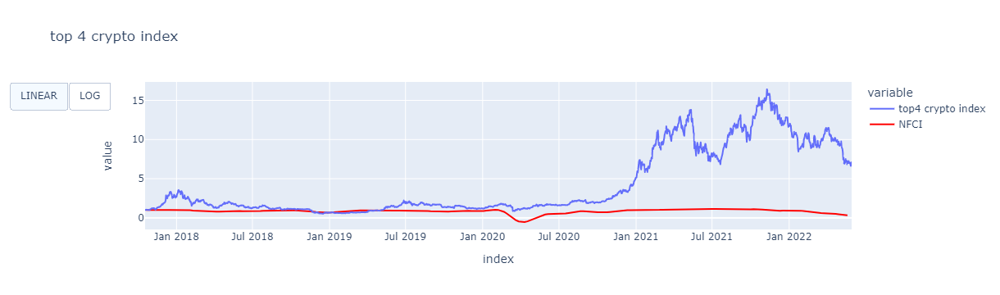

In [61]:
fig0 = plot_log_unif(df_idx_top4, 'top 4 crypto index')

FCI_tmp = FCI.loc[FCI.index.isin(df_idx_top4.index), :]
fig0_tmp = FCI_tmp.div(FCI_tmp['NFCI'][0]).plot(color_discrete_sequence=["red", "black"])
fig0.add_trace(fig0_tmp.data[0])
# # fig0.show()

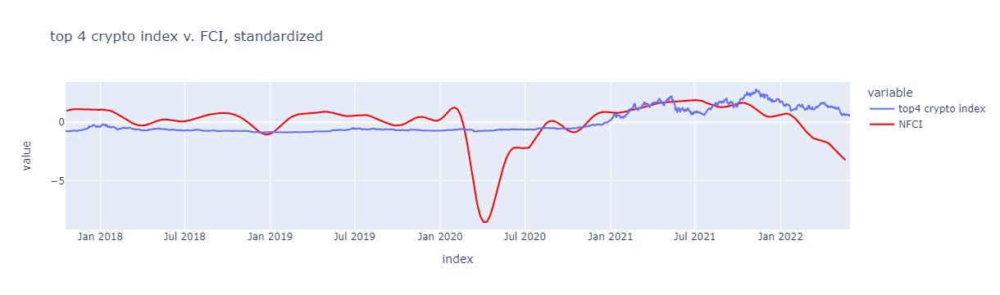

In [13]:
stdd_df_idx_top4 = (df_idx_top4 - df_idx_top4.mean())/df_idx_top4.std()
stdd_FCI_tmp = (FCI_tmp - FCI_tmp.mean())/FCI_tmp.std()
fig1 = stdd_df_idx_top4.plot(title='top 4 crypto index v. FCI, standardized')
fig1_tmp = stdd_FCI_tmp.div(stdd_FCI_tmp['NFCI'][0]).plot(color_discrete_sequence=["red", "black"])
fig1.add_trace(fig1_tmp.data[0])
fig1.show()

## Macro Backdrop - Financial Conditions

In [ ]:
# Financial Conditions

# Monetary Policy Turnaround

# Population Shift

## Google Search Trend
[crpto ponzi](https://trends.google.com/trends/explore?q=crypto%20ponzi)

<iframe
  src="https://trends.google.com/trends/explore?q=crypto%20ponzi"
  width="100%"
  height="500px"
>
</iframe>

In [ ]:
# STEPN sustainability questions
# must be sustainable WITHOUT new users in the long run

# Outperforming Cryptos
<font size=4>Is Community Ownership Becoming New (and Deserving) Paradigm?

In [ ]:
# get top 100 con list
all_coins = cg.get_coins_markets()
# tron, BAT, 

# community coin index v. crypto index

In [476]:
# drop stable coins and take top 100
non_stable_100 = coinmap.loc[~coinmap['name'].str.contains('USD'), :].head(100)

In [ ]:
# get price data from Binanace --> compile in 3-month and 6-month tranches (Binance listing date)
start = '2000-01-01'
end = '2022-05-31'
df_100 = pd.DataFrame()
for sym in non_stable_100.symbol:
    if sym in exclude: continue
    try:
        df_pr = get_ohlc_from_bianace(sym + "BUSD", interval="1d", start_date=start, end_date=end)
        df_pr = df_pr.rename(columns={'time':'date'}).set_index('date')['Close']
        df_pr.name = sym
        df_100 = pd.concat([df_100, pd.to_numeric(df_pr)], axis=1)
        print(sym)
    except:
        print('error: ', sym)
        continue           

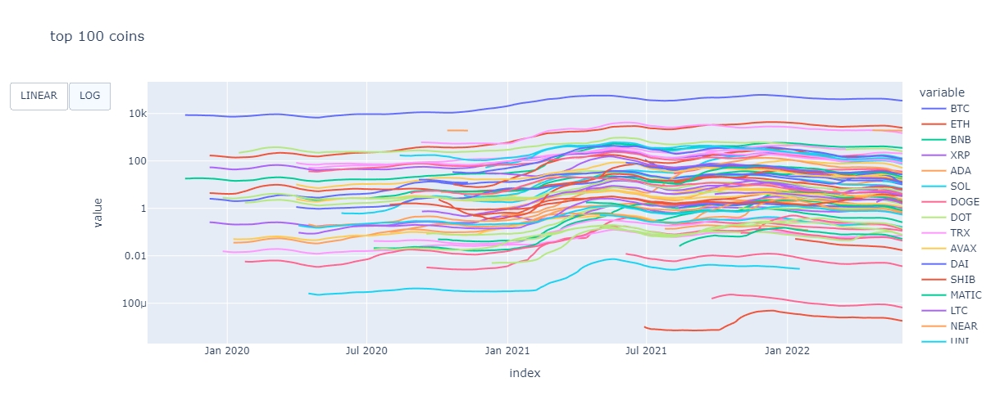

In [601]:
ff = plot_log_unif(df_100.rolling(50).mean(), 'top 100 coins', 'closest')
ff.layout.update(height=500)
ff.show()

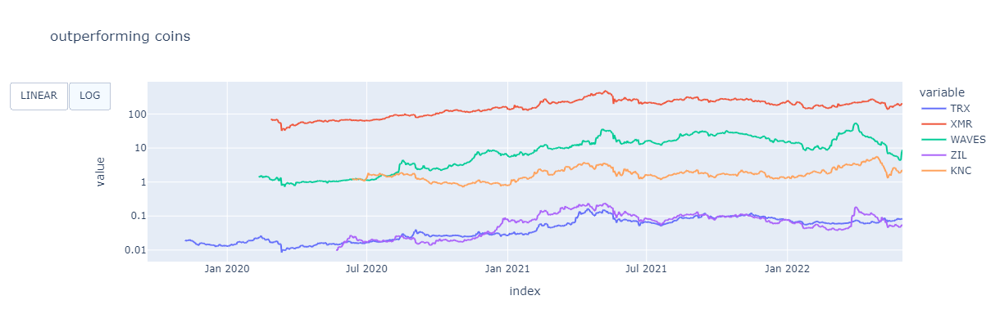

In [599]:
# outperforming cryptos
filt = df_100.iloc[-100, :] < df_100.iloc[-1,:]
# filt.columns = filt.columns.to_flat_index()
df_outperform = df_100.T.loc[filt.squeeze().to_list(), :].T
# df_outperform = df_100.loc[:, filt.reset_index(drop=True)]
ff = plot_log_unif(df_outperform, 'outperforming coins', 'closest')
ff.layout.update(height=400)
ff.show()

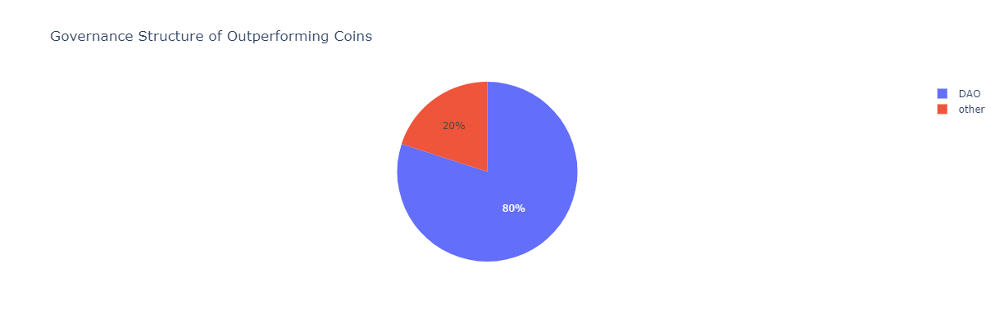

In [611]:
df_outperform.columns

names_ = df_outperform.columns.to_list()
DAO_ = ['other','DAO','DAO','other','DAO']

structure = pd.DataFrame({'name':names_, 'DAO':DAO_})
D_ = structure[['name', 'DAO']].groupby('DAO').count()

import plotly.graph_objects as go     
# go.Figure(data=[go.Pie(labels=labels, values=values)])
figout = go.Figure(data=go.Pie(labels=D_.index, values=D_['name'].to_list()))
figout.layout.update(height=400, width=600, title_text='Governance Structure of Outperforming Coins')
figout.show()